In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from policyengine_us import Simulation
from policyengine_core.reforms import Reform

/Users/pavelmakarchuk/anaconda3/envs/pe/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# SALT and AMT Case Study

This notebook analyzes the impact of different tax policies on households in high-tax states (NY, NJ, CA, PA) at different income levels. We'll compare:

1. Current law
2. Current policy
3. Current policy + SALT capped at $25k single/$50k married filing jointly

In [2]:

current_policy = Reform.from_dict(
    {
        "gov.irs.income.bracket.rates.2": {"2026-01-01.2100-12-31": 0.12},
        "gov.irs.income.bracket.rates.3": {"2026-01-01.2100-12-31": 0.22},
        "gov.irs.income.bracket.rates.4": {"2026-01-01.2100-12-31": 0.24},
        "gov.irs.income.bracket.rates.5": {"2026-01-01.2100-12-31": 0.32},
        "gov.irs.income.bracket.rates.7": {"2026-01-01.2100-12-31": 0.37},
        "gov.irs.deductions.qbi.max.rate": {"2026-01-01.2100-12-31": 0.2},
        "gov.irs.income.exemption.amount": {"2026-01-01.2100-12-31": 0},
        "gov.irs.deductions.qbi.max.w2_wages.rate": {"2026-01-01.2100-12-31": 0.5},
        "gov.irs.deductions.standard.amount.JOINT": {
            "2026-01-01.2026-12-31": 30600,
            "2027-01-01.2027-12-31": 31225,
            "2028-01-01.2028-12-31": 31825,
            "2029-01-01.2029-12-31": 32425,
            "2030-01-01.2030-12-31": 33050,
            "2031-01-01.2031-12-31": 33725,
            "2032-01-01.2032-12-31": 34400,
            "2033-01-01.2033-12-31": 35075,
            "2034-01-01.2034-12-31": 35775,
            "2035-01-01.2035-12-31": 36500,
        },
        "gov.irs.credits.ctc.amount.base[0].amount": {"2026-01-01.2100-12-31": 2000},
        "gov.irs.deductions.standard.amount.SINGLE": {
            "2026-01-01.2026-12-31": 15300,
            "2027-01-01.2027-12-31": 15600,
            "2028-01-01.2028-12-31": 15900,
            "2029-01-01.2029-12-31": 16225,
            "2030-01-01.2030-12-31": 16525,
            "2031-01-01.2031-12-31": 16850,
            "2032-01-01.2032-12-31": 17200,
            "2033-01-01.2033-12-31": 17550,
            "2034-01-01.2034-12-31": 17900,
            "2035-01-01.2035-12-31": 18250,
        },
        "gov.irs.income.amt.exemption.amount.JOINT": {
            "2026-01-01.2026-12-31": 139850,
            "2027-01-01.2027-12-31": 142675,
            "2028-01-01.2028-12-31": 145425,
            "2029-01-01.2029-12-31": 148200,
            "2030-01-01.2030-12-31": 151100,
            "2031-01-01.2031-12-31": 154100,
            "2032-01-01.2032-12-31": 157150,
            "2033-01-01.2033-12-31": 160300,
            "2034-01-01.2034-12-31": 163525,
            "2035-01-01.2035-12-31": 166850,
        },
        "gov.irs.income.bracket.thresholds.3.JOINT": {
            "2026-01-01.2026-12-31": 210950,
            "2027-01-01.2027-12-31": 215225,
            "2028-01-01.2028-12-31": 219375,
            "2029-01-01.2029-12-31": 223525,
            "2030-01-01.2030-12-31": 227925,
            "2031-01-01.2031-12-31": 232425,
            "2032-01-01.2032-12-31": 237075,
            "2033-01-01.2033-12-31": 241825,
            "2034-01-01.2034-12-31": 246675,
            "2035-01-01.2035-12-31": 251675,
        },
        "gov.irs.income.bracket.thresholds.4.JOINT": {
            "2026-01-01.2026-12-31": 402725,
            "2027-01-01.2027-12-31": 410875,
            "2028-01-01.2028-12-31": 418800,
            "2029-01-01.2029-12-31": 426725,
            "2030-01-01.2030-12-31": 435125,
            "2031-01-01.2031-12-31": 443725,
            "2032-01-01.2032-12-31": 452575,
            "2033-01-01.2033-12-31": 461650,
            "2034-01-01.2034-12-31": 470925,
            "2035-01-01.2035-12-31": 480450,
        },
        "gov.irs.income.bracket.thresholds.5.JOINT": {
            "2026-01-01.2026-12-31": 511400,
            "2027-01-01.2027-12-31": 521775,
            "2028-01-01.2028-12-31": 531850,
            "2029-01-01.2029-12-31": 541925,
            "2030-01-01.2030-12-31": 552575,
            "2031-01-01.2031-12-31": 563500,
            "2032-01-01.2032-12-31": 574725,
            "2033-01-01.2033-12-31": 586250,
            "2034-01-01.2034-12-31": 598050,
            "2035-01-01.2035-12-31": 610125,
        },
        "gov.irs.income.bracket.thresholds.6.JOINT": {
            "2026-01-01.2026-12-31": 767125,
            "2027-01-01.2027-12-31": 782650,
            "2028-01-01.2028-12-31": 797775,
            "2029-01-01.2029-12-31": 812875,
            "2030-01-01.2030-12-31": 828850,
            "2031-01-01.2031-12-31": 845250,
            "2032-01-01.2032-12-31": 862100,
            "2033-01-01.2033-12-31": 879350,
            "2034-01-01.2034-12-31": 897050,
            "2035-01-01.2035-12-31": 915200,
        },
        "gov.irs.credits.ctc.amount.adult_dependent": {"2026-01-01.2100-12-31": 500},
        "gov.irs.income.amt.exemption.amount.SINGLE": {
            "2026-01-01.2026-12-31": 89925,
            "2027-01-01.2027-12-31": 91750,
            "2028-01-01.2028-12-31": 93525,
            "2029-01-01.2029-12-31": 95300,
            "2030-01-01.2030-12-31": 97150,
            "2031-01-01.2031-12-31": 99075,
            "2032-01-01.2032-12-31": 101050,
            "2033-01-01.2033-12-31": 103075,
            "2034-01-01.2034-12-31": 105150,
            "2035-01-01.2035-12-31": 107275,
        },
        "gov.irs.income.bracket.thresholds.3.SINGLE": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.SINGLE": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.SINGLE": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.SINGLE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.itemized.casualty.active": {"2026-01-01.2100-12-31": False},
        "gov.irs.deductions.standard.amount.SEPARATE": {
            "2026-01-01.2026-12-31": 15300,
            "2027-01-01.2027-12-31": 15600,
            "2028-01-01.2028-12-31": 15900,
            "2029-01-01.2029-12-31": 16225,
            "2030-01-01.2030-12-31": 16525,
            "2031-01-01.2031-12-31": 16850,
            "2032-01-01.2032-12-31": 17200,
            "2033-01-01.2033-12-31": 17550,
            "2034-01-01.2034-12-31": 17900,
            "2035-01-01.2035-12-31": 18250,
        },
        "gov.irs.deductions.qbi.max.w2_wages.alt_rate": {"2026-01-01.2100-12-31": 0.25},
        "gov.irs.deductions.qbi.phase_out.start.JOINT": {
            "2024-01-01.2024-12-31": 396450,
            "2025-01-01.2025-12-31": 400575,
            "2026-01-01.2026-12-31": 409800,
            "2027-01-01.2027-12-31": 418100,
            "2028-01-01.2028-12-31": 426175,
            "2029-01-01.2029-12-31": 434225,
            "2030-01-01.2030-12-31": 442775,
            "2031-01-01.2031-12-31": 451525,
            "2032-01-01.2032-12-31": 460525,
            "2033-01-01.2033-12-31": 469750,
            "2034-01-01.2034-12-31": 479200,
            "2035-01-01.2035-12-31": 488900,
        },
        "gov.irs.income.amt.exemption.amount.SEPARATE": {
            "2026-01-01.2026-12-31": 69925,
            "2027-01-01.2027-12-31": 71350,
            "2028-01-01.2028-12-31": 72725,
            "2029-01-01.2029-12-31": 74100,
            "2030-01-01.2030-12-31": 75550,
            "2031-01-01.2031-12-31": 77050,
            "2032-01-01.2032-12-31": 78575,
            "2033-01-01.2033-12-31": 80150,
            "2034-01-01.2034-12-31": 81775,
            "2035-01-01.2035-12-31": 83425,
        },
        "gov.irs.income.bracket.thresholds.3.SEPARATE": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.SEPARATE": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.SEPARATE": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.SEPARATE": {
            "2026-01-01.2026-12-31": 383550,
            "2027-01-01.2027-12-31": 391325,
            "2028-01-01.2028-12-31": 398875,
            "2029-01-01.2029-12-31": 406450,
            "2030-01-01.2030-12-31": 414425,
            "2031-01-01.2031-12-31": 422625,
            "2032-01-01.2032-12-31": 431050,
            "2033-01-01.2033-12-31": 439675,
            "2034-01-01.2034-12-31": 448525,
            "2035-01-01.2035-12-31": 457600,
        },
        "gov.irs.credits.ctc.phase_out.threshold.JOINT": {
            "2026-01-01.2100-12-31": 400000
        },
        "gov.irs.credits.ctc.refundable.individual_max": {
            "2026-01-01.2026-12-31": 1800,
            "2027-01-01.2027-12-31": 1800,
            "2028-01-01.2028-12-31": 1800,
            "2029-01-01.2029-12-31": 1900,
            "2030-01-01.2030-12-31": 1900,
            "2031-01-01.2031-12-31": 1900,
            "2032-01-01.2032-12-31": 2000,
            "2033-01-01.2033-12-31": 2000,
            "2034-01-01.2034-12-31": 2000,
            "2035-01-01.2035-12-31": 2000,
        },
        "gov.irs.deductions.qbi.phase_out.length.JOINT": {
            "2026-01-01.2100-12-31": 100000
        },
        "gov.irs.deductions.qbi.phase_out.start.SINGLE": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SINGLE": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.SINGLE": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.charity.ceiling.all": {
            "2026-01-01.2100-12-31": 0.6
        },
        "gov.irs.deductions.itemized.limitation.agi_rate": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.qbi.phase_out.start.SEPARATE": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SEPARATE": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.SEPARATE": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.credits.ctc.refundable.phase_in.threshold": {
            "2026-01-01.2100-12-31": 2500
        },
        "gov.irs.deductions.qbi.max.business_property.rate": {
            "2026-01-01.2100-12-31": 0.025
        },
        "gov.irs.income.amt.exemption.phase_out.start.JOINT": {
            "2026-01-01.2026-12-31": 1278575,
            "2027-01-01.2027-12-31": 1304475,
            "2028-01-01.2028-12-31": 1329675,
            "2029-01-01.2029-12-31": 1354850,
            "2030-01-01.2030-12-31": 1381475,
            "2031-01-01.2031-12-31": 1408825,
            "2032-01-01.2032-12-31": 1436875,
            "2033-01-01.2033-12-31": 1465650,
            "2034-01-01.2034-12-31": 1495150,
            "2035-01-01.2035-12-31": 1525375,
        },
        "gov.irs.deductions.standard.amount.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 30600,
            "2027-01-01.2027-12-31": 31225,
            "2028-01-01.2028-12-31": 31825,
            "2029-01-01.2029-12-31": 32425,
            "2030-01-01.2030-12-31": 33050,
            "2031-01-01.2031-12-31": 33725,
            "2032-01-01.2032-12-31": 34400,
            "2033-01-01.2033-12-31": 35075,
            "2034-01-01.2034-12-31": 35775,
            "2035-01-01.2035-12-31": 36500,
        },
        "gov.irs.income.amt.exemption.phase_out.start.SINGLE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.standard.amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 22950,
            "2027-01-01.2027-12-31": 23425,
            "2028-01-01.2028-12-31": 23875,
            "2029-01-01.2029-12-31": 24325,
            "2030-01-01.2030-12-31": 24800,
            "2031-01-01.2031-12-31": 25300,
            "2032-01-01.2032-12-31": 25800,
            "2033-01-01.2033-12-31": 26300,
            "2034-01-01.2034-12-31": 26825,
            "2035-01-01.2035-12-31": 27375,
        },
        "gov.irs.income.amt.exemption.amount.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 139850,
            "2027-01-01.2027-12-31": 142675,
            "2028-01-01.2028-12-31": 145425,
            "2029-01-01.2029-12-31": 148200,
            "2030-01-01.2030-12-31": 151100,
            "2031-01-01.2031-12-31": 154100,
            "2032-01-01.2032-12-31": 157150,
            "2033-01-01.2033-12-31": 160300,
            "2034-01-01.2034-12-31": 163525,
            "2035-01-01.2035-12-31": 166850,
        },
        "gov.irs.income.bracket.thresholds.3.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 210950,
            "2027-01-01.2027-12-31": 215225,
            "2028-01-01.2028-12-31": 219375,
            "2029-01-01.2029-12-31": 223525,
            "2030-01-01.2030-12-31": 227925,
            "2031-01-01.2031-12-31": 232425,
            "2032-01-01.2032-12-31": 237075,
            "2033-01-01.2033-12-31": 241825,
            "2034-01-01.2034-12-31": 246675,
            "2035-01-01.2035-12-31": 251675,
        },
        "gov.irs.income.bracket.thresholds.4.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 402725,
            "2027-01-01.2027-12-31": 410875,
            "2028-01-01.2028-12-31": 418800,
            "2029-01-01.2029-12-31": 426725,
            "2030-01-01.2030-12-31": 435125,
            "2031-01-01.2031-12-31": 443725,
            "2032-01-01.2032-12-31": 452575,
            "2033-01-01.2033-12-31": 461650,
            "2034-01-01.2034-12-31": 470925,
            "2035-01-01.2035-12-31": 480450,
        },
        "gov.irs.income.bracket.thresholds.5.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 511400,
            "2027-01-01.2027-12-31": 521775,
            "2028-01-01.2028-12-31": 531850,
            "2029-01-01.2029-12-31": 541925,
            "2030-01-01.2030-12-31": 552575,
            "2031-01-01.2031-12-31": 563500,
            "2032-01-01.2032-12-31": 574725,
            "2033-01-01.2033-12-31": 586250,
            "2034-01-01.2034-12-31": 598050,
            "2035-01-01.2035-12-31": 610125,
        },
        "gov.irs.income.bracket.thresholds.6.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 767125,
            "2027-01-01.2027-12-31": 782650,
            "2028-01-01.2028-12-31": 797775,
            "2029-01-01.2029-12-31": 812875,
            "2030-01-01.2030-12-31": 828850,
            "2031-01-01.2031-12-31": 845250,
            "2032-01-01.2032-12-31": 862100,
            "2033-01-01.2033-12-31": 879350,
            "2034-01-01.2034-12-31": 897050,
            "2035-01-01.2035-12-31": 915200,
        },
        "gov.irs.income.amt.exemption.amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 89925,
            "2027-01-01.2027-12-31": 91750,
            "2028-01-01.2028-12-31": 93525,
            "2029-01-01.2029-12-31": 95300,
            "2030-01-01.2030-12-31": 97150,
            "2031-01-01.2031-12-31": 99075,
            "2032-01-01.2032-12-31": 101050,
            "2033-01-01.2033-12-31": 103075,
            "2034-01-01.2034-12-31": 105150,
            "2035-01-01.2035-12-31": 107275,
        },
        "gov.irs.income.amt.exemption.phase_out.start.SEPARATE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.income.bracket.thresholds.3.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.qbi.phase_out.start.SURVIVING_SPOUSE": {
            "2024-01-01.2024-12-31": 396450,
            "2025-01-01.2025-12-31": 400575,
            "2026-01-01.2026-12-31": 409800,
            "2027-01-01.2027-12-31": 418100,
            "2028-01-01.2028-12-31": 426175,
            "2029-01-01.2029-12-31": 434225,
            "2030-01-01.2030-12-31": 442775,
            "2031-01-01.2031-12-31": 451525,
            "2032-01-01.2032-12-31": 460525,
            "2033-01-01.2033-12-31": 469750,
            "2034-01-01.2034-12-31": 479200,
            "2035-01-01.2035-12-31": 488900,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 400000
        },
        "gov.irs.deductions.qbi.phase_out.length.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 100000
        },
        "gov.irs.deductions.qbi.phase_out.start.HEAD_OF_HOUSEHOLD": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.JOINT": {
            "2026-01-01.2100-12-31": 10000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SINGLE": {
            "2026-01-01.2100-12-31": 10000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SEPARATE": {
            "2026-01-01.2100-12-31": 5000
        },
        "gov.irs.income.amt.exemption.phase_out.start.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 1278575,
            "2027-01-01.2027-12-31": 1304475,
            "2028-01-01.2028-12-31": 1329675,
            "2029-01-01.2029-12-31": 1354850,
            "2030-01-01.2030-12-31": 1381475,
            "2031-01-01.2031-12-31": 1408825,
            "2032-01-01.2032-12-31": 1436875,
            "2033-01-01.2033-12-31": 1465650,
            "2034-01-01.2034-12-31": 1495150,
            "2035-01-01.2035-12-31": 1525375,
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.JOINT": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.itemized_deduction_rate": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.income.amt.exemption.phase_out.start.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SINGLE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SEPARATE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 10000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 10000
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.simulation.branch_to_determine_itemization": {
            "2026-01-01.2100-12-31": True
        },
    },
    country_id="us",
)


In [3]:

current_policy_50k = Reform.from_dict(
    {
        "gov.irs.income.bracket.rates.2": {"2026-01-01.2100-12-31": 0.12},
        "gov.irs.income.bracket.rates.3": {"2026-01-01.2100-12-31": 0.22},
        "gov.irs.income.bracket.rates.4": {"2026-01-01.2100-12-31": 0.24},
        "gov.irs.income.bracket.rates.5": {"2026-01-01.2100-12-31": 0.32},
        "gov.irs.income.bracket.rates.7": {"2026-01-01.2100-12-31": 0.37},
        "gov.irs.deductions.qbi.max.rate": {"2026-01-01.2100-12-31": 0.2},
        "gov.irs.income.exemption.amount": {"2026-01-01.2100-12-31": 0},
        "gov.irs.deductions.qbi.max.w2_wages.rate": {"2026-01-01.2100-12-31": 0.5},
        "gov.irs.deductions.standard.amount.JOINT": {
            "2026-01-01.2026-12-31": 30600,
            "2027-01-01.2027-12-31": 31225,
            "2028-01-01.2028-12-31": 31825,
            "2029-01-01.2029-12-31": 32425,
            "2030-01-01.2030-12-31": 33050,
            "2031-01-01.2031-12-31": 33725,
            "2032-01-01.2032-12-31": 34400,
            "2033-01-01.2033-12-31": 35075,
            "2034-01-01.2034-12-31": 35775,
            "2035-01-01.2035-12-31": 36500,
        },
        "gov.irs.credits.ctc.amount.base[0].amount": {"2026-01-01.2100-12-31": 2000},
        "gov.irs.deductions.standard.amount.SINGLE": {
            "2026-01-01.2026-12-31": 15300,
            "2027-01-01.2027-12-31": 15600,
            "2028-01-01.2028-12-31": 15900,
            "2029-01-01.2029-12-31": 16225,
            "2030-01-01.2030-12-31": 16525,
            "2031-01-01.2031-12-31": 16850,
            "2032-01-01.2032-12-31": 17200,
            "2033-01-01.2033-12-31": 17550,
            "2034-01-01.2034-12-31": 17900,
            "2035-01-01.2035-12-31": 18250,
        },
        "gov.irs.income.amt.exemption.amount.JOINT": {
            "2026-01-01.2026-12-31": 139850,
            "2027-01-01.2027-12-31": 142675,
            "2028-01-01.2028-12-31": 145425,
            "2029-01-01.2029-12-31": 148200,
            "2030-01-01.2030-12-31": 151100,
            "2031-01-01.2031-12-31": 154100,
            "2032-01-01.2032-12-31": 157150,
            "2033-01-01.2033-12-31": 160300,
            "2034-01-01.2034-12-31": 163525,
            "2035-01-01.2035-12-31": 166850,
        },
        "gov.irs.income.bracket.thresholds.3.JOINT": {
            "2026-01-01.2026-12-31": 210950,
            "2027-01-01.2027-12-31": 215225,
            "2028-01-01.2028-12-31": 219375,
            "2029-01-01.2029-12-31": 223525,
            "2030-01-01.2030-12-31": 227925,
            "2031-01-01.2031-12-31": 232425,
            "2032-01-01.2032-12-31": 237075,
            "2033-01-01.2033-12-31": 241825,
            "2034-01-01.2034-12-31": 246675,
            "2035-01-01.2035-12-31": 251675,
        },
        "gov.irs.income.bracket.thresholds.4.JOINT": {
            "2026-01-01.2026-12-31": 402725,
            "2027-01-01.2027-12-31": 410875,
            "2028-01-01.2028-12-31": 418800,
            "2029-01-01.2029-12-31": 426725,
            "2030-01-01.2030-12-31": 435125,
            "2031-01-01.2031-12-31": 443725,
            "2032-01-01.2032-12-31": 452575,
            "2033-01-01.2033-12-31": 461650,
            "2034-01-01.2034-12-31": 470925,
            "2035-01-01.2035-12-31": 480450,
        },
        "gov.irs.income.bracket.thresholds.5.JOINT": {
            "2026-01-01.2026-12-31": 511400,
            "2027-01-01.2027-12-31": 521775,
            "2028-01-01.2028-12-31": 531850,
            "2029-01-01.2029-12-31": 541925,
            "2030-01-01.2030-12-31": 552575,
            "2031-01-01.2031-12-31": 563500,
            "2032-01-01.2032-12-31": 574725,
            "2033-01-01.2033-12-31": 586250,
            "2034-01-01.2034-12-31": 598050,
            "2035-01-01.2035-12-31": 610125,
        },
        "gov.irs.income.bracket.thresholds.6.JOINT": {
            "2026-01-01.2026-12-31": 767125,
            "2027-01-01.2027-12-31": 782650,
            "2028-01-01.2028-12-31": 797775,
            "2029-01-01.2029-12-31": 812875,
            "2030-01-01.2030-12-31": 828850,
            "2031-01-01.2031-12-31": 845250,
            "2032-01-01.2032-12-31": 862100,
            "2033-01-01.2033-12-31": 879350,
            "2034-01-01.2034-12-31": 897050,
            "2035-01-01.2035-12-31": 915200,
        },
        "gov.irs.credits.ctc.amount.adult_dependent": {"2026-01-01.2100-12-31": 500},
        "gov.irs.income.amt.exemption.amount.SINGLE": {
            "2026-01-01.2026-12-31": 89925,
            "2027-01-01.2027-12-31": 91750,
            "2028-01-01.2028-12-31": 93525,
            "2029-01-01.2029-12-31": 95300,
            "2030-01-01.2030-12-31": 97150,
            "2031-01-01.2031-12-31": 99075,
            "2032-01-01.2032-12-31": 101050,
            "2033-01-01.2033-12-31": 103075,
            "2034-01-01.2034-12-31": 105150,
            "2035-01-01.2035-12-31": 107275,
        },
        "gov.irs.income.bracket.thresholds.3.SINGLE": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.SINGLE": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.SINGLE": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.SINGLE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.itemized.casualty.active": {"2026-01-01.2100-12-31": False},
        "gov.irs.deductions.standard.amount.SEPARATE": {
            "2026-01-01.2026-12-31": 15300,
            "2027-01-01.2027-12-31": 15600,
            "2028-01-01.2028-12-31": 15900,
            "2029-01-01.2029-12-31": 16225,
            "2030-01-01.2030-12-31": 16525,
            "2031-01-01.2031-12-31": 16850,
            "2032-01-01.2032-12-31": 17200,
            "2033-01-01.2033-12-31": 17550,
            "2034-01-01.2034-12-31": 17900,
            "2035-01-01.2035-12-31": 18250,
        },
        "gov.irs.deductions.qbi.max.w2_wages.alt_rate": {"2026-01-01.2100-12-31": 0.25},
        "gov.irs.deductions.qbi.phase_out.start.JOINT": {
            "2024-01-01.2024-12-31": 396450,
            "2025-01-01.2025-12-31": 400575,
            "2026-01-01.2026-12-31": 409800,
            "2027-01-01.2027-12-31": 418100,
            "2028-01-01.2028-12-31": 426175,
            "2029-01-01.2029-12-31": 434225,
            "2030-01-01.2030-12-31": 442775,
            "2031-01-01.2031-12-31": 451525,
            "2032-01-01.2032-12-31": 460525,
            "2033-01-01.2033-12-31": 469750,
            "2034-01-01.2034-12-31": 479200,
            "2035-01-01.2035-12-31": 488900,
        },
        "gov.irs.income.amt.exemption.amount.SEPARATE": {
            "2026-01-01.2026-12-31": 69925,
            "2027-01-01.2027-12-31": 71350,
            "2028-01-01.2028-12-31": 72725,
            "2029-01-01.2029-12-31": 74100,
            "2030-01-01.2030-12-31": 75550,
            "2031-01-01.2031-12-31": 77050,
            "2032-01-01.2032-12-31": 78575,
            "2033-01-01.2033-12-31": 80150,
            "2034-01-01.2034-12-31": 81775,
            "2035-01-01.2035-12-31": 83425,
        },
        "gov.irs.income.bracket.thresholds.3.SEPARATE": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.SEPARATE": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.SEPARATE": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.SEPARATE": {
            "2026-01-01.2026-12-31": 383550,
            "2027-01-01.2027-12-31": 391325,
            "2028-01-01.2028-12-31": 398875,
            "2029-01-01.2029-12-31": 406450,
            "2030-01-01.2030-12-31": 414425,
            "2031-01-01.2031-12-31": 422625,
            "2032-01-01.2032-12-31": 431050,
            "2033-01-01.2033-12-31": 439675,
            "2034-01-01.2034-12-31": 448525,
            "2035-01-01.2035-12-31": 457600,
        },
        "gov.irs.credits.ctc.phase_out.threshold.JOINT": {
            "2026-01-01.2100-12-31": 400000
        },
        "gov.irs.credits.ctc.refundable.individual_max": {
            "2026-01-01.2026-12-31": 1800,
            "2027-01-01.2027-12-31": 1800,
            "2028-01-01.2028-12-31": 1800,
            "2029-01-01.2029-12-31": 1900,
            "2030-01-01.2030-12-31": 1900,
            "2031-01-01.2031-12-31": 1900,
            "2032-01-01.2032-12-31": 2000,
            "2033-01-01.2033-12-31": 2000,
            "2034-01-01.2034-12-31": 2000,
            "2035-01-01.2035-12-31": 2000,
        },
        "gov.irs.deductions.qbi.phase_out.length.JOINT": {
            "2026-01-01.2100-12-31": 100000
        },
        "gov.irs.deductions.qbi.phase_out.start.SINGLE": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SINGLE": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.SINGLE": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.charity.ceiling.all": {
            "2026-01-01.2100-12-31": 0.6
        },
        "gov.irs.deductions.itemized.limitation.agi_rate": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.qbi.phase_out.start.SEPARATE": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SEPARATE": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.SEPARATE": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.credits.ctc.refundable.phase_in.threshold": {
            "2026-01-01.2100-12-31": 2500
        },
        "gov.irs.deductions.qbi.max.business_property.rate": {
            "2026-01-01.2100-12-31": 0.025
        },
        "gov.irs.income.amt.exemption.phase_out.start.JOINT": {
            "2026-01-01.2026-12-31": 1278575,
            "2027-01-01.2027-12-31": 1304475,
            "2028-01-01.2028-12-31": 1329675,
            "2029-01-01.2029-12-31": 1354850,
            "2030-01-01.2030-12-31": 1381475,
            "2031-01-01.2031-12-31": 1408825,
            "2032-01-01.2032-12-31": 1436875,
            "2033-01-01.2033-12-31": 1465650,
            "2034-01-01.2034-12-31": 1495150,
            "2035-01-01.2035-12-31": 1525375,
        },
        "gov.irs.deductions.standard.amount.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 30600,
            "2027-01-01.2027-12-31": 31225,
            "2028-01-01.2028-12-31": 31825,
            "2029-01-01.2029-12-31": 32425,
            "2030-01-01.2030-12-31": 33050,
            "2031-01-01.2031-12-31": 33725,
            "2032-01-01.2032-12-31": 34400,
            "2033-01-01.2033-12-31": 35075,
            "2034-01-01.2034-12-31": 35775,
            "2035-01-01.2035-12-31": 36500,
        },
        "gov.irs.income.amt.exemption.phase_out.start.SINGLE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.standard.amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 22950,
            "2027-01-01.2027-12-31": 23425,
            "2028-01-01.2028-12-31": 23875,
            "2029-01-01.2029-12-31": 24325,
            "2030-01-01.2030-12-31": 24800,
            "2031-01-01.2031-12-31": 25300,
            "2032-01-01.2032-12-31": 25800,
            "2033-01-01.2033-12-31": 26300,
            "2034-01-01.2034-12-31": 26825,
            "2035-01-01.2035-12-31": 27375,
        },
        "gov.irs.income.amt.exemption.amount.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 139850,
            "2027-01-01.2027-12-31": 142675,
            "2028-01-01.2028-12-31": 145425,
            "2029-01-01.2029-12-31": 148200,
            "2030-01-01.2030-12-31": 151100,
            "2031-01-01.2031-12-31": 154100,
            "2032-01-01.2032-12-31": 157150,
            "2033-01-01.2033-12-31": 160300,
            "2034-01-01.2034-12-31": 163525,
            "2035-01-01.2035-12-31": 166850,
        },
        "gov.irs.income.bracket.thresholds.3.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 210950,
            "2027-01-01.2027-12-31": 215225,
            "2028-01-01.2028-12-31": 219375,
            "2029-01-01.2029-12-31": 223525,
            "2030-01-01.2030-12-31": 227925,
            "2031-01-01.2031-12-31": 232425,
            "2032-01-01.2032-12-31": 237075,
            "2033-01-01.2033-12-31": 241825,
            "2034-01-01.2034-12-31": 246675,
            "2035-01-01.2035-12-31": 251675,
        },
        "gov.irs.income.bracket.thresholds.4.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 402725,
            "2027-01-01.2027-12-31": 410875,
            "2028-01-01.2028-12-31": 418800,
            "2029-01-01.2029-12-31": 426725,
            "2030-01-01.2030-12-31": 435125,
            "2031-01-01.2031-12-31": 443725,
            "2032-01-01.2032-12-31": 452575,
            "2033-01-01.2033-12-31": 461650,
            "2034-01-01.2034-12-31": 470925,
            "2035-01-01.2035-12-31": 480450,
        },
        "gov.irs.income.bracket.thresholds.5.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 511400,
            "2027-01-01.2027-12-31": 521775,
            "2028-01-01.2028-12-31": 531850,
            "2029-01-01.2029-12-31": 541925,
            "2030-01-01.2030-12-31": 552575,
            "2031-01-01.2031-12-31": 563500,
            "2032-01-01.2032-12-31": 574725,
            "2033-01-01.2033-12-31": 586250,
            "2034-01-01.2034-12-31": 598050,
            "2035-01-01.2035-12-31": 610125,
        },
        "gov.irs.income.bracket.thresholds.6.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 767125,
            "2027-01-01.2027-12-31": 782650,
            "2028-01-01.2028-12-31": 797775,
            "2029-01-01.2029-12-31": 812875,
            "2030-01-01.2030-12-31": 828850,
            "2031-01-01.2031-12-31": 845250,
            "2032-01-01.2032-12-31": 862100,
            "2033-01-01.2033-12-31": 879350,
            "2034-01-01.2034-12-31": 897050,
            "2035-01-01.2035-12-31": 915200,
        },
        "gov.irs.income.amt.exemption.amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 89925,
            "2027-01-01.2027-12-31": 91750,
            "2028-01-01.2028-12-31": 93525,
            "2029-01-01.2029-12-31": 95300,
            "2030-01-01.2030-12-31": 97150,
            "2031-01-01.2031-12-31": 99075,
            "2032-01-01.2032-12-31": 101050,
            "2033-01-01.2033-12-31": 103075,
            "2034-01-01.2034-12-31": 105150,
            "2035-01-01.2035-12-31": 107275,
        },
        "gov.irs.income.amt.exemption.phase_out.start.SEPARATE": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.income.bracket.thresholds.3.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 105475,
            "2027-01-01.2027-12-31": 107600,
            "2028-01-01.2028-12-31": 109700,
            "2029-01-01.2029-12-31": 111775,
            "2030-01-01.2030-12-31": 113950,
            "2031-01-01.2031-12-31": 116225,
            "2032-01-01.2032-12-31": 118525,
            "2033-01-01.2033-12-31": 120900,
            "2034-01-01.2034-12-31": 123350,
            "2035-01-01.2035-12-31": 125825,
        },
        "gov.irs.income.bracket.thresholds.4.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 201350,
            "2027-01-01.2027-12-31": 205425,
            "2028-01-01.2028-12-31": 209400,
            "2029-01-01.2029-12-31": 213375,
            "2030-01-01.2030-12-31": 217550,
            "2031-01-01.2031-12-31": 221875,
            "2032-01-01.2032-12-31": 226275,
            "2033-01-01.2033-12-31": 230825,
            "2034-01-01.2034-12-31": 235475,
            "2035-01-01.2035-12-31": 240225,
        },
        "gov.irs.income.bracket.thresholds.5.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 255700,
            "2027-01-01.2027-12-31": 260875,
            "2028-01-01.2028-12-31": 265925,
            "2029-01-01.2029-12-31": 270950,
            "2030-01-01.2030-12-31": 276275,
            "2031-01-01.2031-12-31": 281750,
            "2032-01-01.2032-12-31": 287375,
            "2033-01-01.2033-12-31": 293125,
            "2034-01-01.2034-12-31": 299025,
            "2035-01-01.2035-12-31": 305075,
        },
        "gov.irs.income.bracket.thresholds.6.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.qbi.phase_out.start.SURVIVING_SPOUSE": {
            "2024-01-01.2024-12-31": 396450,
            "2025-01-01.2025-12-31": 400575,
            "2026-01-01.2026-12-31": 409800,
            "2027-01-01.2027-12-31": 418100,
            "2028-01-01.2028-12-31": 426175,
            "2029-01-01.2029-12-31": 434225,
            "2030-01-01.2030-12-31": 442775,
            "2031-01-01.2031-12-31": 451525,
            "2032-01-01.2032-12-31": 460525,
            "2033-01-01.2033-12-31": 469750,
            "2034-01-01.2034-12-31": 479200,
            "2035-01-01.2035-12-31": 488900,
        },
        "gov.irs.credits.ctc.phase_out.threshold.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 400000
        },
        "gov.irs.deductions.qbi.phase_out.length.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 100000
        },
        "gov.irs.deductions.qbi.phase_out.start.HEAD_OF_HOUSEHOLD": {
            "2024-01-01.2024-12-31": 198225,
            "2025-01-01.2025-12-31": 200275,
            "2026-01-01.2026-12-31": 204900,
            "2027-01-01.2027-12-31": 209050,
            "2028-01-01.2028-12-31": 213075,
            "2029-01-01.2029-12-31": 217125,
            "2030-01-01.2030-12-31": 221375,
            "2031-01-01.2031-12-31": 225775,
            "2032-01-01.2032-12-31": 230275,
            "2033-01-01.2033-12-31": 234875,
            "2034-01-01.2034-12-31": 239600,
            "2035-01-01.2035-12-31": 244450,
        },
        "gov.irs.credits.ctc.phase_out.threshold.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 200000
        },
        "gov.irs.deductions.qbi.phase_out.length.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.JOINT": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SINGLE": {
            "2026-01-01.2100-12-31": 25000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SEPARATE": {
            "2026-01-01.2100-12-31": 25000
        },
        "gov.irs.income.amt.exemption.phase_out.start.SURVIVING_SPOUSE": {
            "2026-01-01.2026-12-31": 1278575,
            "2027-01-01.2027-12-31": 1304475,
            "2028-01-01.2028-12-31": 1329675,
            "2029-01-01.2029-12-31": 1354850,
            "2030-01-01.2030-12-31": 1381475,
            "2031-01-01.2031-12-31": 1408825,
            "2032-01-01.2032-12-31": 1436875,
            "2033-01-01.2033-12-31": 1465650,
            "2034-01-01.2034-12-31": 1495150,
            "2035-01-01.2035-12-31": 1525375,
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.JOINT": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.itemized_deduction_rate": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.income.amt.exemption.phase_out.start.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2026-12-31": 639300,
            "2027-01-01.2027-12-31": 652250,
            "2028-01-01.2028-12-31": 664825,
            "2029-01-01.2029-12-31": 677425,
            "2030-01-01.2030-12-31": 690725,
            "2031-01-01.2031-12-31": 704400,
            "2032-01-01.2032-12-31": 718425,
            "2033-01-01.2033-12-31": 732825,
            "2034-01-01.2034-12-31": 747575,
            "2035-01-01.2035-12-31": 762675,
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SINGLE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SEPARATE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": 50000
        },
        "gov.irs.deductions.itemized.salt_and_real_estate.cap.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": 25000
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.SURVIVING_SPOUSE": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.irs.deductions.itemized.limitation.applicable_amount.HEAD_OF_HOUSEHOLD": {
            "2026-01-01.2100-12-31": np.inf
        },
        "gov.simulation.branch_to_determine_itemization": {
            "2026-01-01.2100-12-31": True
        },
    },
    country_id="us",
)


In [4]:

baseline_brachning_reform = Reform.from_dict(
    {
        "gov.simulation.branch_to_determine_itemization": {"2026-01-01.2100-12-31": True},
    },
    country_id="us",
)


## Setup Household Scenarios

Each household is married filing jointly across four states (NY, NJ, CA, PA) with the following income and property tax levels:
1. $250k income ($11,250 property tax)
2. $500k income ($22,500 property tax)
3. $750k income ($33,750 property tax)
4. $1M income ($45,000 property tax)

In [5]:
# Define the states and income/tax levels
states = ["NY", "NJ", "CA", "PA"]
income_levels = [250000, 500000, 750000, 1000000]
property_taxes = [11250, 22500, 33750, 45000]

In [28]:
# Function to calculate net income and other metrics for a given scenario
def calculate_metrics(state, income, property_tax, reform):
    # Create the situation dictionary with this state, income, and property tax
    situation = {
        "people": {
            "you": {
                "age": {2026: 40},
                "employment_income": {2026: income},
                "real_estate_taxes": {2026: property_tax},
            },
            "your partner": {"age": {2026: 40}},
        },
        "families": {"your family": {"members": ["you", "your partner"]}},
        "tax_units": {"your tax unit": {"members": ["you", "your partner"]}},
        "spm_units": {"your household": {"members": ["you", "your partner"]}},
        "households": {
            "your household": {
                "members": ["you", "your partner"],
                "state_name": {2026: state},
            }
        },
    }
    
    # Run the simulation
    simulation = Simulation(situation=situation, reform=reform)
    
    # Calculate and return metrics
    return {
        "net_income": simulation.calculate("household_net_income", 2026)[0],
        "regular_tax": simulation.calculate("regular_tax_before_credits", 2026)[0],
        "amt": simulation.calculate("amt_base_tax", 2026)[0],
        "salt_deduction": simulation.calculate("salt_deduction", 2026)[0],
        "federal_tax": simulation.calculate("income_tax", 2026)[0]
    }

In [29]:
# Create lists to store results
results_data = []

# Calculate results for all scenarios
for state in states:
    for i, income in enumerate(income_levels):
        property_tax = property_taxes[i]
        
        # Run the simulations for each policy
        current_law_results = calculate_metrics(state, income, property_tax, baseline_brachning_reform)
        current_policy_results = calculate_metrics(state, income, property_tax, current_policy)
        current_policy_50k_results = calculate_metrics(state, income, property_tax, current_policy_50k)
        
        # Add results to our data list
        results_data.append({
            "state": state,
            "income": income,
            "property_tax": property_tax,
            "current_law_net_income": current_law_results["net_income"],
            "current_policy_net_income": current_policy_results["net_income"],
            "current_policy_50k_net_income": current_policy_50k_results["net_income"],
            "current_law_regular_tax": current_law_results["regular_tax"],
            "current_law_amt": current_law_results["amt"],
            "current_law_salt_deduction": current_law_results["salt_deduction"],
            "current_policy_regular_tax": current_policy_results["regular_tax"],
            "current_policy_amt": current_policy_results["amt"],
            "current_policy_salt_deduction": current_policy_results["salt_deduction"],
            "current_policy_50k_regular_tax": current_policy_50k_results["regular_tax"],
            "current_policy_50k_amt": current_policy_50k_results["amt"],
            "current_policy_50k_salt_deduction": current_policy_50k_results["salt_deduction"]
        })

# Convert to DataFrame
results_df = pd.DataFrame(results_data)
results_df

,state,income,property_tax,current_law_net_income,current_policy_net_income,current_policy_50k_net_income,current_law_regular_tax,current_law_amt,current_law_salt_deduction,current_policy_regular_tax,current_policy_amt,current_policy_salt_deduction,current_policy_50k_regular_tax,current_policy_50k_amt,current_policy_50k_salt_deduction
0,NY,250000,11250,"$177,939.05","$182,715.25","$182,715.25","$42,867.20","$39,104.00","$25,427.85","$38,091.00","$28,639.00","$10,000.00","$38,091.00","$28,639.00","$25,427.85"
1,NY,500000,22500,"$321,527.69","$342,834.69","$349,042.69","$114,130.88","$124,732.00","$53,802.85","$103,425.00","$95,962.00","$10,000.00","$97,217.00","$95,962.00","$50,000.00"
2,NY,750000,33750,"$468,910.31","$484,365.31","$491,155.31","$193,278.56","$205,120.00","$82,177.85","$189,665.00","$165,962.00","$10,000.00","$182,875.00","$165,962.00","$50,000.00"
3,NY,1000000,45000,"$620,758.88","$620,590.44","$627,768.44","$281,042.06","$275,120.00","$110,552.85","$281,210.50","$235,962.00","$10,000.00","$274,032.50","$235,962.00","$50,000.00"
4,NJ,250000,11250,"$180,813.34","$185,713.53","$185,713.53","$42,991.19","$39,104.00","$24,985.05","$38,091.00","$28,639.00","$10,000.00","$38,091.00","$28,639.00","$24,985.05"
5,NJ,500000,22500,"$327,511.41","$348,818.41","$355,026.41","$114,672.99","$124,732.00","$52,160.05","$103,425.00","$95,962.00","$10,000.00","$97,217.00","$95,962.00","$50,000.00"
6,NJ,750000,33750,"$469,265.41","$484,720.41","$491,510.41","$191,840.61","$205,120.00","$85,809.05","$189,665.00","$165,962.00","$10,000.00","$182,875.00","$165,962.00","$50,000.00"
7,NJ,1000000,45000,"$618,580.12","$614,874.88","$622,052.88","$277,505.31","$275,120.00","$119,484.05","$281,210.50","$235,962.00","$10,000.00","$274,032.50","$235,962.00","$50,000.00"
8,CA,250000,11250,"$178,649.25","$182,034.25","$182,034.25","$41,476.01","$39,104.00","$30,396.41","$38,091.00","$28,639.00","$10,000.00","$38,091.00","$28,639.00","$30,396.41"
9,CA,500000,22500,"$317,125.12","$338,432.12","$344,640.12","$109,923.93","$124,732.00","$66,551.16","$103,425.00","$95,962.00","$10,000.00","$97,217.00","$95,962.00","$50,000.00"


## Figure 1: Net Income Under Different Tax Policies

In [30]:
# Create a figure comparing net income across policies
fig1 = px.bar(
    results_df,
    x="income",
    y=["current_law_net_income", "current_policy_net_income", "current_policy_50k_net_income"],
    barmode="group",
    facet_col="state",
    facet_col_wrap=2,
    labels={
        "income": "Household Income ($)",
        "value": "Net Income ($)",
        "variable": "Policy"
    },
    title="Net Income Under Different Tax Policies",
    color_discrete_map={
        "current_law_net_income": "#1f77b4",
        "current_policy_net_income": "#ff7f0e",
        "current_policy_50k_net_income": "#2ca02c"
    }
)

# Improve legend labels
newnames = {
    'current_law_net_income': 'Current Law', 
    'current_policy_net_income': 'Current Policy (SALT cap $10k)', 
    'current_policy_50k_net_income': 'Current Policy (SALT cap $50k MFJ/$25k Single)'
}
fig1.for_each_trace(lambda t: t.update(name=newnames[t.name]))

# Format axes as currency
fig1.update_xaxes(tickprefix="$", tickformat=",.0f")
fig1.update_yaxes(tickprefix="$", tickformat=",.0f")

fig1.show()

## Figure 2: Effective SALT Cap Analysis

In [54]:
# Function to calculate effective SALT cap for varying property tax levels
def calculate_effective_salt_cap(state, income, reform):
    situation = {
        "people": {
            "you": {
                "age": {2026: 40},
                "employment_income": {2026: income},
            },
            "your partner": {"age": {2026: 40}},
        },
        "families": {"your family": {"members": ["you", "your partner"]}},
        "tax_units": {"your tax unit": {"members": ["you", "your partner"]}},
        "spm_units": {"your household": {"members": ["you", "your partner"]}},
        "households": {
            "your household": {
                "members": ["you", "your partner"],
                "state_name": {2026: state},
            }
        },
        # Set up the axis for property taxes
        "axes": [
            [{"name": "real_estate_taxes", "count": 1250, "min": -25000, "max": 100000}]
        ],
    }
    
    simulation = Simulation(situation=situation, reform=reform)
    
    # Calculate values along the axis
    property_taxes_axis = simulation.calculate("real_estate_taxes", map_to = "household", period =2026)
    regular_tax = simulation.calculate("regular_tax_before_credits", map_to = "household", period =2026)
    amt = simulation.calculate("amt_base_tax", map_to = "household", period =2026)
    salt_deduction = simulation.calculate("salt_deduction", map_to = "household", period =2026)
    sales_or_income_tax = simulation.calculate("state_and_local_sales_or_income_tax", period =2026)
    
        # Create DataFrame with data
    effective_caps = pd.DataFrame({
        "property_tax": property_taxes_axis,
        "regular_tax": regular_tax,
        "amt": amt,
        "salt_deduction": salt_deduction,
        "sales_or_income_tax": sales_or_income_tax,
        "amt_binds": amt > regular_tax,
        
    })
    return effective_caps

In [55]:
# Calculate effective SALT caps for each state and income level
effective_cap_data = []

for state in states:
    for income in income_levels:
        print(f"\nAnalyzing state {state} with income {income}")
        
        # Calculate for current law
        current_law_caps = calculate_effective_salt_cap(state, income, baseline_brachning_reform)
        current_law_caps['policy'] = 'Current Law'
        current_law_caps['state'] = state
        current_law_caps['income'] = income
        
        # Calculate for current policy
        current_policy_caps = calculate_effective_salt_cap(state, income, current_policy)
        current_policy_caps['policy'] = 'Current Policy'
        current_policy_caps['state'] = state
        current_policy_caps['income'] = income

        
        
        effective_cap_data.append(current_law_caps)
        effective_cap_data.append(current_policy_caps)

# Combine into a single DataFrame
effective_cap_df = pd.concat(effective_cap_data, ignore_index=True)
effective_cap_df.head()


Analyzing state NY with income 250000

Analyzing state NY with income 500000

Analyzing state NY with income 750000

Analyzing state NY with income 1000000

Analyzing state NJ with income 250000

Analyzing state NJ with income 500000

Analyzing state NJ with income 750000

Analyzing state NJ with income 1000000

Analyzing state CA with income 250000

Analyzing state CA with income 500000

Analyzing state CA with income 750000

Analyzing state CA with income 1000000

Analyzing state PA with income 250000

Analyzing state PA with income 500000

Analyzing state PA with income 750000

Analyzing state PA with income 1000000


,property_tax,regular_tax,amt,salt_deduction,sales_or_income_tax,amt_binds,policy,state,income
0,-25793.001953,45339.0,39104.0,-11615.152344,14177.849609,False,Current Law,NY,250000
1,-25689.746094,45339.0,39104.0,-11511.896484,14177.849609,False,Current Law,NY,250000
2,-25586.492188,45339.0,39104.0,-11408.642578,14177.849609,False,Current Law,NY,250000
3,-25483.236328,45339.0,39104.0,-11305.386719,14177.849609,False,Current Law,NY,250000
4,-25379.982422,45339.0,39104.0,-11202.132812,14177.849609,False,Current Law,NY,250000


In [56]:
effective_cap_df.to_csv('effective_cap_data_all.csv', index=False)

In [57]:
def find_first_binding_points_current_law(df):
    # Create an empty list to store the results
    binding_points = []
    
    # Filter for Current Law only
    current_law_df = df[df['policy'] == 'Current Law']
    
    # Get unique combinations of state and income
    combinations = current_law_df.groupby(['state', 'income']).groups.keys()
    
    for state, income in combinations:
        # Filter data for this combination
        subset = current_law_df[(current_law_df['state'] == state) & 
                               (current_law_df['income'] == income)]
        
        # Sort by property_tax to ensure we find the earliest point
        subset = subset.sort_values('property_tax')
        
        # Find the first row where binds is True
        first_binding = subset[subset['amt_binds'] == True]
        
        if not first_binding.empty:
            # Get the first row where binding occurs
            binding_row = first_binding.iloc[0]
            binding_points.append(binding_row)
        else:
            # If no binding occurs, we can either skip or include a placeholder
            print(f"No binding found for {state}, income ${income} under Current Law")
    
    # Convert the list to a DataFrame
    if binding_points:
        binding_df = pd.DataFrame(binding_points)
        return binding_df
    else:
        return pd.DataFrame()

# Apply the function to your dataframe
first_binding_points = find_first_binding_points_current_law(effective_cap_df)


# Format for better readability
formatted_results = first_binding_points[['state', 'income', 'property_tax', 
                                         'regular_tax', 'amt', 'salt_deduction', 
                                         'sales_or_income_tax', 'amt_binds']]
formatted_results = formatted_results.sort_values(['state', 'income'])

# Create a more readable table
def format_currency(val):
    return f"${val:,.2f}" if isinstance(val, (int, float)) else val

readable_results = formatted_results.copy()
for col in ['property_tax', 'regular_tax', 'amt', 'salt_deduction', 'sales_or_income_tax', 'income']:
    if col in readable_results.columns:
        readable_results[col] = readable_results[col].apply(format_currency)

print("\nFormatted binding points table (Current Law only):")
display(readable_results)


Formatted binding points table (Current Law only):


,state,income,property_tax,regular_tax,amt,salt_deduction,sales_or_income_tax,amt_binds
20441,CA,"$250,000.00","$19,742.28","$39,098.17","$39,104.00","$38,888.70","$19,146.41",True
22534,CA,"$500,000.00","$-22,282.34","$124,702.11","$124,732.00","$21,768.81","$44,051.16",True
25056,CA,"$750,000.00","$-20,010.74","$205,113.98","$205,120.00","$52,290.41","$72,301.16",True
27968,CA,"$1,000,000.00","$22,530.16","$275,107.12","$275,120.00","$125,540.05","$103,009.89",True
10494,NJ,"$250,000.00","$25,214.77","$39,081.05","$39,104.00","$38,949.82","$13,735.05",True
12673,NJ,"$500,000.00","$-7,929.95","$124,714.88","$124,732.00","$21,730.10","$29,660.05",True
15252,NJ,"$750,000.00",$227.16,"$205,115.67","$205,120.00","$52,286.21","$52,059.05",True
18244,NJ,"$1,000,000.00","$51,028.43","$275,118.06","$275,120.00","$125,512.47","$74,484.05",True
489,NY,"$250,000.00","$24,698.50","$39,101.62","$39,104.00","$38,876.35","$14,177.85",True
2657,NY,"$500,000.00","$-9,582.03","$124,717.95","$124,732.00","$21,720.82","$31,302.85",True


In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import os

# Assuming your DataFrame is already created and called effective_cap_df
# Create separate graphs for each state and income level, but include both policies on each graph

# Get unique states and income levels
states = effective_cap_df['state'].unique()
income_levels = effective_cap_df['income'].unique()

# Colors for different policies
colors = {'Current Law': 'blue', 'Current Policy': 'red'}

# Create a list to store all figures
all_figures = []

# For each state and income, create a separate plot with both policies
for state in states:
    for income in income_levels:
        # Filter data for this state and income
        state_income_data = effective_cap_df[(effective_cap_df['state'] == state) & 
                                           (effective_cap_df['income'] == income)]
        
        # Skip if no data for this combination
        if state_income_data.empty:
            continue
            
        # Create a new figure for this state/income combination
        fig = go.Figure()
        
        # Check if we have data for both policies
        has_current_law = 'Current Law' in state_income_data['policy'].values
        has_current_policy = 'Current Policy' in state_income_data['policy'].values
        
        # Add lines for Current Law if available
        if has_current_law:
            current_law_data = state_income_data[state_income_data['policy'] == 'Current Law']
            current_law_data = current_law_data.sort_values('property_tax')
            
            # Add regular tax line for Current Law
            fig.add_trace(
                go.Scatter(
                    x=current_law_data['property_tax'],
                    y=current_law_data['regular_tax'],
                    mode='lines',
                    name="Current Law - Regular Tax",
                    line=dict(color=colors['Current Law']),
                    hovertemplate="<b>Current Law - Regular Tax</b><br>" +
                                 "Property Tax: $%{x:,.2f}<br>" +
                                 "Regular Tax: $%{y:,.2f}<br>" +
                                 "SALT Deduction: $%{customdata[0]:,.2f}<br>" +
                                 "Sales Tax: $%{customdata[1]:,.2f}<br>",
                    customdata=np.stack((current_law_data['salt_deduction'], 
                                        current_law_data['sales_or_income_tax']), axis=1)
                )
            )
            
            # Add AMT line for Current Law
            fig.add_trace(
                go.Scatter(
                    x=current_law_data['property_tax'],
                    y=current_law_data['amt'],
                    mode='lines',
                    name="Current Law - AMT",
                    line=dict(color=colors['Current Law'], dash='dash'),
                    hovertemplate="<b>Current Law - AMT</b><br>" +
                                 "Property Tax: $%{x:,.2f}<br>" +
                                 "AMT: $%{y:,.2f}<br>" +
                                 "SALT Deduction: $%{customdata[0]:,.2f}<br>" +
                                 "Sales Tax: $%{customdata[1]:,.2f}<br>",
                    customdata=np.stack((current_law_data['salt_deduction'], 
                                        current_law_data['sales_or_income_tax']), axis=1)
                )
            )
            
            # Highlight binding point if applicable
            binding_data = current_law_data[current_law_data['amt_binds'] == True]
            if not binding_data.empty:
                first_binding = binding_data.iloc[0]
                
                # Add vertical line at binding point
                fig.add_vline(x=first_binding['property_tax'], 
                              line_dash="dot", line_color="blue",
                              annotation_text="Current Law Effective SALT Cap", 
                              annotation_position="top right")
                
                # Add marker at intersection point
                fig.add_trace(
                    go.Scatter(
                        x=[first_binding['property_tax']],
                        y=[first_binding['amt']],
                        mode='markers',
                        marker=dict(size=10, color='blue'),
                        name="Current Law Effective SALT Cap",
                        hovertemplate="<b>Current Law Effective SALT Cap</b><br>" +
                                     "Property Tax: $%{x:,.2f}<br>" +
                                     "Tax Amount: $%{y:,.2f}<br>",
                        showlegend=True
                    )
                )
        
        # Add lines for Current Policy if available
        if has_current_policy:
            current_policy_data = state_income_data[state_income_data['policy'] == 'Current Policy']
            current_policy_data = current_policy_data.sort_values('property_tax')
            
            # Add regular tax line for Current Policy
            fig.add_trace(
                go.Scatter(
                    x=current_policy_data['property_tax'],
                    y=current_policy_data['regular_tax'],
                    mode='lines',
                    name="Current Policy - Regular Tax",
                    line=dict(color=colors['Current Policy']),
                    hovertemplate="<b>Current Policy - Regular Tax</b><br>" +
                                 "Property Tax: $%{x:,.2f}<br>" +
                                 "Regular Tax: $%{y:,.2f}<br>" +
                                 "SALT Deduction: $%{customdata[0]:,.2f}<br>" +
                                 "Sales Tax: $%{customdata[1]:,.2f}<br>",
                    customdata=np.stack((current_policy_data['salt_deduction'], 
                                        current_policy_data['sales_or_income_tax']), axis=1)
                )
            )
            
            # Add AMT line for Current Policy
            fig.add_trace(
                go.Scatter(
                    x=current_policy_data['property_tax'],
                    y=current_policy_data['amt'],
                    mode='lines',
                    name="Current Policy - AMT",
                    line=dict(color=colors['Current Policy'], dash='dash'),
                    hovertemplate="<b>Current Policy - AMT</b><br>" +
                                 "Property Tax: $%{x:,.2f}<br>" +
                                 "AMT: $%{y:,.2f}<br>" +
                                 "SALT Deduction: $%{customdata[0]:,.2f}<br>" +
                                 "Sales Tax: $%{customdata[1]:,.2f}<br>",
                    customdata=np.stack((current_policy_data['salt_deduction'], 
                                        current_policy_data['sales_or_income_tax']), axis=1)
                )
            )
            
            # Highlight binding point if applicable for Current Policy
            binding_data = current_policy_data[current_policy_data['amt_binds'] == True]
            if not binding_data.empty:
                first_binding = binding_data.iloc[0]
                
                # Add vertical line at binding point
                fig.add_vline(x=first_binding['property_tax'], 
                              line_dash="dot", line_color="red",
                              annotation_text="Current Policy Effective SALT Cap", 
                              annotation_position="bottom right")
                
                # Add marker at intersection point
                fig.add_trace(
                    go.Scatter(
                        x=[first_binding['property_tax']],
                        y=[first_binding['amt']],
                        mode='markers',
                        marker=dict(size=10, color='red'),
                        name="Current Policy Binding Point",
                        hovertemplate="<b>Current Policy Effective SALT Cap</b><br>" +
                                     "Property Tax: $%{x:,.2f}<br>" +
                                     "Tax Amount: $%{y:,.2f}<br>" +
                                     "Effective SALT Cap: $%{customdata[0]:,.2f}<br>",
                        customdata=np.stack((current_policy_data['salt_deduction'], 
                                        current_policy_data['sales_or_income_tax']), axis=1),
                        showlegend=True
                    )
                )
        
        # Update layout
        fig.update_layout(
            height=600,
            width=900,
            title_text=f"Tax Liability for {state}, Income ${income:,}",
            legend_title="Tax Type",
            template="plotly_white",
            hovermode="closest",
            xaxis=dict(title="Property Tax ($)", tickprefix="$", tickformat=",.2f"),
            yaxis=dict(title="Tax Liability ($)", tickprefix="$", tickformat=",.2f")
        )
        
        # Add the figure to our list
        all_figures.append(fig)
        
        # Save individual figure if needed
        # fig.write_html(f"tax_plots/{state}_{income}.html")

# To display the figures sequentially, you can use:
for fig in all_figures:
    fig.show()

## Effective SALT cap graph

Comparing the SALT cap as income rises with steady property taxes

In [49]:
# Function to calculate effective SALT cap for varying property tax levels
def calculate_effective_salt_cap_over_earnings(state, reform):
    situation = {
        "people": {
            "you": {
                "age": {2026: 40},
            },
            "your partner": {"age": {2026: 40}},
        },
        "families": {"your family": {"members": ["you", "your partner"]}},
        "tax_units": {"your tax unit": {"members": ["you", "your partner"]}},
        "spm_units": {"your household": {"members": ["you", "your partner"]}},
        "households": {
            "your household": {
                "members": ["you", "your partner"],
                "state_name": {2026: state},
            }
        },
        # Set up the axis for property taxes
        "axes": [
                [{"name": "real_estate_taxes", "count": 300, "min": 0, "max": 140000}],
                [{"name": "employment_income", "count": 4000, "min": 0, "max": 1000000}],
                
        ],
    }
    
    simulation = Simulation(situation=situation, reform=reform)
    
    # Calculate values along the axis
    employment_income_axis = simulation.calculate("employment_income", map_to = "household", period =2026)
    property_taxes_axis = simulation.calculate("real_estate_taxes", map_to = "household", period =2026)
    
    regular_tax = simulation.calculate("regular_tax_before_credits", map_to = "household", period =2026)
    amt = simulation.calculate("amt_base_tax", map_to = "household", period =2026)
    salt_deduction = simulation.calculate("salt_deduction", map_to = "household", period =2026)
    sales_or_income_tax = simulation.calculate("state_and_local_sales_or_income_tax", period =2026)
    salt_and_property_tax = property_taxes_axis + sales_or_income_tax
    income_tax = simulation.calculate("income_tax", map_to = "household", period =2026)
    
        # Create DataFrame with data
    effective_caps_over_earnings = pd.DataFrame({
        "employment_income": employment_income_axis,
        "property_tax": property_taxes_axis,
        "regular_tax": regular_tax,
        "amt": amt,
        "salt_deduction": salt_deduction,
        "sales_or_income_tax": sales_or_income_tax,
        "amt_binds": amt > regular_tax,
        "salt_and_property_tax": salt_and_property_tax,
        "income_tax": income_tax
    })
    return effective_caps_over_earnings

In [50]:
# Calculate effective SALT caps for each state and income level
effective_cap_over_earnings_data = []

for state in states:
    print(f"\nAnalyzing state {state}")
    
    # Calculate for current law
    current_law_caps_over_earnings = calculate_effective_salt_cap_over_earnings(state, baseline_brachning_reform)
    current_law_caps_over_earnings['policy'] = 'Current Law'
    current_law_caps_over_earnings['state'] = state
    
    # Calculate for current policy
    current_policy_caps_over_earnings = calculate_effective_salt_cap_over_earnings(state, current_policy)
    current_policy_caps_over_earnings['policy'] = 'Current Policy'
    current_policy_caps_over_earnings['state'] = state

    
    effective_cap_over_earnings_data.append(current_law_caps_over_earnings)
    effective_cap_over_earnings_data.append(current_policy_caps_over_earnings)

# Combine into a single DataFrame
effective_cap_over_earnings_df = pd.concat(effective_cap_over_earnings_data, ignore_index=True)



Analyzing state NY

Analyzing state NJ

Analyzing state CA

Analyzing state PA


In [51]:
effective_cap_over_earnings_df = effective_cap_over_earnings_df.sort_values(
    by=['state', 'policy', 'employment_income', 'property_tax']
)

# Calculate the marginal property tax rate
def calculate_marginal_rate(group):
    # Calculate differences in income tax and property tax
    group['income_tax_diff'] = group['income_tax'].diff()
    group['property_tax_diff'] = group['property_tax'].diff()
    
    # Calculate the marginal rate (change in income tax / change in property tax)
    group['marginal_property_tax_rate'] = -group['income_tax_diff'] / group['property_tax_diff']
    
    # Handle edge cases (divide by zero, first row in group)
    group['marginal_property_tax_rate'] = group['marginal_property_tax_rate'].replace([np.inf, -np.inf, np.nan], 0)
    
    return group

# Apply the calculation for each combination of state, policy, and income level
effective_cap_over_earnings_df = effective_cap_over_earnings_df.groupby(
    ['state', 'policy', 'employment_income']
).apply(calculate_marginal_rate).reset_index(drop=True)

# Clean up temporary columns if desired
effective_cap_over_earnings_df = effective_cap_over_earnings_df.drop(
    columns=['income_tax_diff', 'property_tax_diff']
)

effective_cap_over_earnings_df.head()

,employment_income,property_tax,regular_tax,amt,salt_deduction,sales_or_income_tax,amt_binds,salt_and_property_tax,income_tax,policy,state,marginal_property_tax_rate
0,0.0,0.000000,0.0,0.0,738.595764,738.595764,False,738.595764,0.0,Current Law,CA,0.0
1,0.0,483.079620,0.0,0.0,1221.675415,738.595764,False,1221.675385,0.0,Current Law,CA,-0.0
2,0.0,966.159241,0.0,0.0,1704.755005,738.595764,False,1704.755005,0.0,Current Law,CA,-0.0
3,0.0,1449.238892,0.0,0.0,2187.834717,738.595764,False,2187.834656,0.0,Current Law,CA,-0.0
4,0.0,1932.318481,0.0,0.0,2670.914307,738.595764,False,2670.914246,0.0,Current Law,CA,-0.0


In [52]:
effective_cap_over_earnings_df.to_csv('effective_cap_data_backup_smaller.csv', index=False)

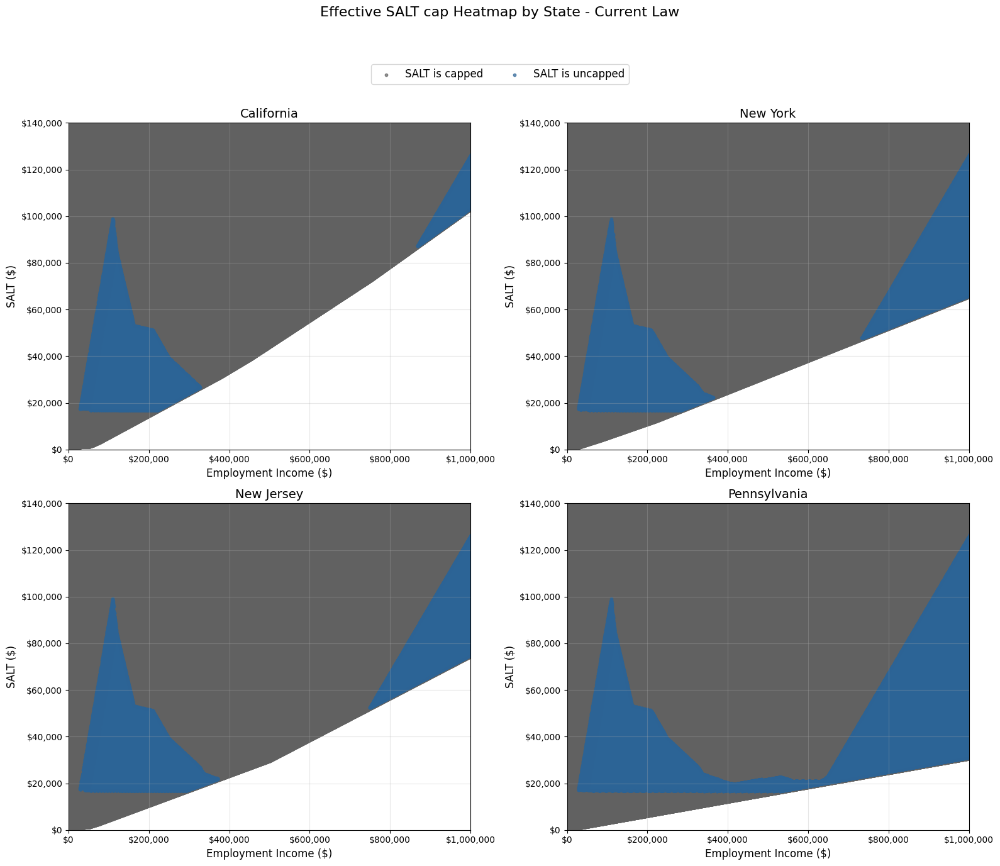

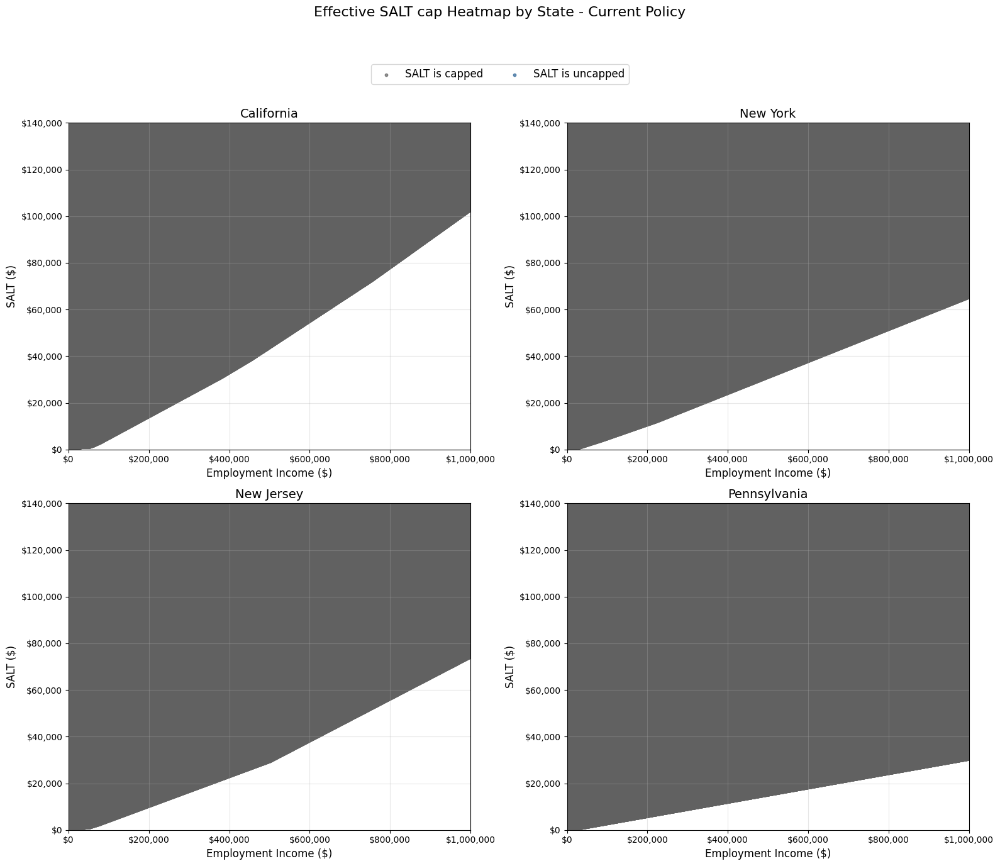

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define colors
BLUE_PRIMARY = "#2C6496"
DARK_GRAY = "#616161"

# Update with your specific states
STATE_NAMES = {
    'CA': 'California',
    'NY': 'New York',
    'NJ': 'New Jersey',
    'PA': 'Pennsylvania'
}

def create_2x2_scatter(df, states=['CA', 'NY', 'NJ', 'PA'], policy='Current Law', threshold=0.1, y_max=150000, x_max=1000000):
    """
    Create a 2x2 grid of scatter plots showing raw data points with a single legend.
    Shows SALT as uncapped when marginal property tax rate is 0 or negative.
    """
    # Create a figure with 2x2 grid of subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    
    # Add a main title for the entire figure
    fig.suptitle(f"Effective SALT cap Heatmap by State - {policy}", fontsize=16, y=0.98)
    
    # Prefilter the dataframe once to only include the relevant policy
    df_filtered = df[df['policy'] == policy]
    
    # For storing legend handles and labels
    legend_handles = []
    legend_labels = []
    
    # Process each state in the appropriate subplot position
    for i, state in enumerate(states[:4]):  # Limit to first 4 states
        # Calculate row and column position
        row = i // 2
        col = i % 2
        
        # Get the appropriate subplot
        ax = axes[row, col]
        
        # Filter data for this state
        mask = df_filtered['state'] == state
        state_data = df_filtered.loc[mask]
        
        # Extract data
        x = state_data['employment_income'].values
        y = state_data['salt_and_property_tax'].values
        
        # Define uncapped as when marginal property tax rate is 0 or negative
        is_uncapped = state_data['marginal_property_tax_rate'].values <= threshold
        is_capped = ~is_uncapped  # Invert for capped points
        
        # Split points by classification
        x_uncapped = x[is_uncapped]
        y_uncapped = y[is_uncapped]
        x_capped = x[is_capped]
        y_capped = y[is_capped]
        
        
        # Plot points directly - no binning, no interpolation
        # Store the scatter plot objects to use for the legend
        uncapped_scatter = ax.scatter(x_uncapped, y_uncapped, color=DARK_GRAY, s=10, alpha=0.7)
        capped_scatter = ax.scatter(x_capped, y_capped, color=BLUE_PRIMARY, s=10, alpha=0.7)
        
        # Store handles for legend only from the first subplot
        if i == 0:
            legend_handles = [uncapped_scatter, capped_scatter]
            legend_labels = ['SALT is capped', 'SALT is uncapped']
        
        # Set fixed y-axis range
        ax.set_ylim(0, y_max)
        ax.set_xlim(0, x_max)
        
        # Add labels and title for this subplot
        ax.set_title(f"{STATE_NAMES.get(state, state)}", fontsize=14)
        ax.set_xlabel("Employment Income ($)", fontsize=12)
        ax.set_ylabel("SALT ($)", fontsize=12)
        
        # Format tick labels as dollars
        ax.xaxis.set_major_formatter('${x:,.0f}')
        ax.yaxis.set_major_formatter('${x:,.0f}')
        
        # Add gridlines
        ax.grid(True, alpha=0.3)
    
    # Create a single legend for the entire figure using handles from the first subplot
    fig.legend(legend_handles, legend_labels, 
               loc='upper center', 
               bbox_to_anchor=(0.5, 0.92),
               ncol=2, 
               fontsize=12)
    
    # Adjust layout to make room for the suptitle and legend
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    
    return fig

def create_2x2_charts_for_policies(df, states=['CA', 'NY', 'NJ', 'PA'], policies=['Current Law', 'Current Policy'], y_max=150000, x_max=1000000):
    """
    Create a 2x2 chart for each policy.
    """
    for policy in policies:
        fig = create_2x2_scatter(df, states, policy, y_max=y_max, x_max=x_max)
        plt.show()
        plt.close(fig)

# Example usage:
df = pd.read_csv('effective_cap_data_backup_smaller.csv')
create_2x2_charts_for_policies(df, y_max=140000, x_max=1000000)

In [63]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define colors
BLUE_PRIMARY = "#2C6496"
DARK_GRAY = "#616161"

# State names mapping
STATE_NAMES = {
    'CA': 'California',
    'NY': 'New York',
    'NJ': 'New Jersey',
    'PA': 'Pennsylvania'
}

def create_max_salt_line_graph(df, state='PA', policy='Current Law', threshold=0.1, y_max=150000):
    """
    Create a line graph showing the maximum SALT values where marginal_property_tax_rate <= threshold
    for each employment income increment, for a specific state.
    
    Parameters:
    -----------
    df : pandas DataFrame
        The dataframe containing the tax data
    state : str
        State code (default: 'PA')
    policy : str
        Policy type (default: 'Current Law')
    threshold : float
        Threshold for marginal_property_tax_rate to be considered uncapped (default: 0.1)
    y_max : int
        Maximum value for y-axis (default: 150000)
    """
    # Filter to only include the specified policy
    df_filtered = df[df['policy'] == policy]
    
    # Filter data for state where marginal_property_tax_rate > threshold
    state_data = df_filtered[(df_filtered['state'] == state) & 
                            (df_filtered['marginal_property_tax_rate'] > threshold)]
    
    
    
    # Sort by employment income for line plotting
    state_data = state_data.sort_values('employment_income')
    
    # For each unique employment income, find the maximum SALT value
    max_salt_by_income = state_data.groupby('employment_income')['salt_and_property_tax'].max().reset_index()
    
    # Sort by income for proper line plotting
    max_salt_by_income = max_salt_by_income.sort_values('employment_income')
    
    # Create figure
    fig = go.Figure()
    
    # Add line trace
    fig.add_trace(go.Scatter(
        x=max_salt_by_income['employment_income'],
        y=max_salt_by_income['salt_and_property_tax'],
        mode='lines',
        line=dict(color=BLUE_PRIMARY, width=1.5),
        name=f"{STATE_NAMES.get(state, state)} SALT",
        hovertemplate='Income: $%{x:,.0f}<br>SALT: $%{y:,.0f}<extra></extra>'
    ))
    
    # Update layout
    fig.update_layout(
        title=f"Effective SALT cap for a married couple under {policy}",
        title_font_size=16,
        xaxis_title="Employment Income ($)",
        yaxis_title="SALT ($)",
        xaxis=dict(
            tickformat="$,.0f",
            showgrid=True,
            gridcolor='rgba(0,0,0,0.1)',
            range=[0, 1000000]
        ),
        yaxis=dict(
            tickformat="$,.0f",
            range=[0, min(y_max, max_salt_by_income['salt_and_property_tax'].max() * 1.1)],
            showgrid=True,
            gridcolor='rgba(0,0,0,0.1)'
        ),
        margin=dict(t=100, b=100),
        hovermode='closest',
        plot_bgcolor='white'
    )
    
    return fig

# Example usage:
df = pd.read_csv('effective_cap_data_backup_smaller.csv')
fig = create_max_salt_line_graph(df, state='PA', policy='Current Law', threshold=0.1, y_max=140000)
fig = format_fig(fig)
fig.show()

State: CA
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2320957
  Negative points (rate <= -0.1): 100094
  Positive points (rate > 0.1): 28949
State: NY
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2307792
  Negative points (rate <= -0.1): 89399
  Positive points (rate > 0.1): 52809
State: NJ
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2310385
  Negative points (rate <= -0.1): 92390
  Positive points (rate > 0.1): 47225
State: PA
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2287802
  Negative points (rate <= -0.1): 78829
  Positive points (rate > 0.1): 83369


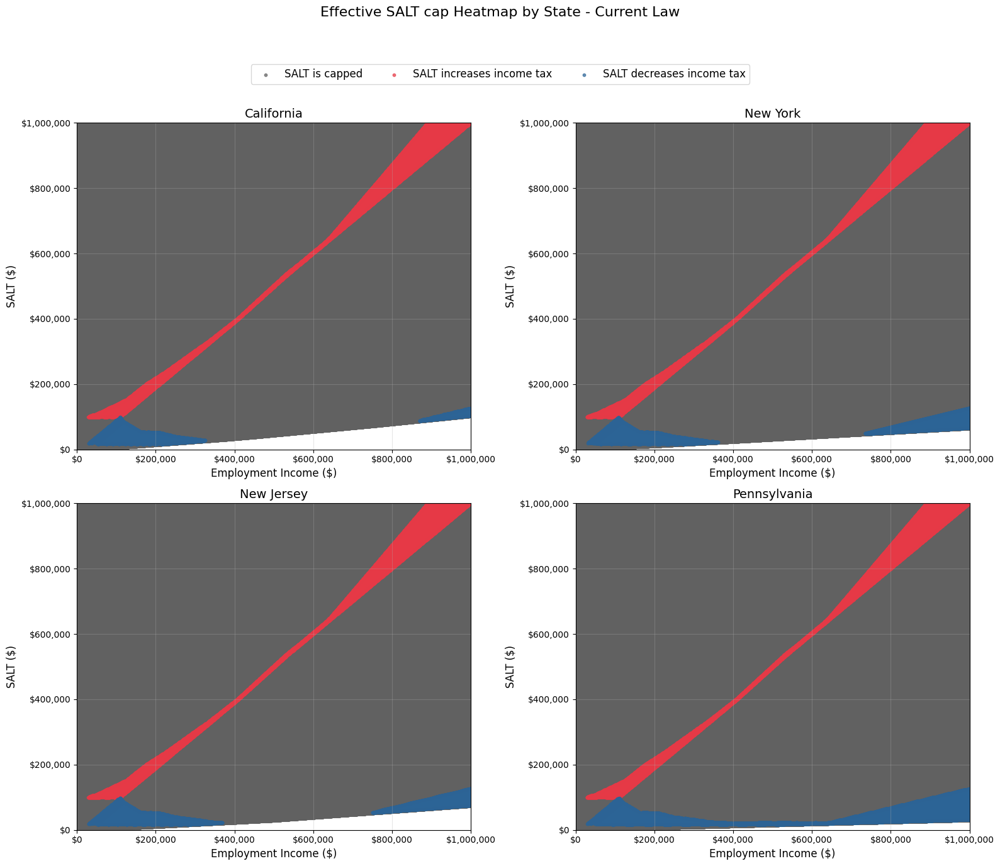

State: CA
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2450000
  Negative points (rate <= -0.1): 0
  Positive points (rate > 0.1): 0
State: NY
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2450000
  Negative points (rate <= -0.1): 0
  Positive points (rate > 0.1): 0
State: NJ
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2450000
  Negative points (rate <= -0.1): 0
  Positive points (rate > 0.1): 0
State: PA
  Total points: 2450000
  Near zero points (-0.1 < rate <= 0.1): 2450000
  Negative points (rate <= -0.1): 0
  Positive points (rate > 0.1): 0


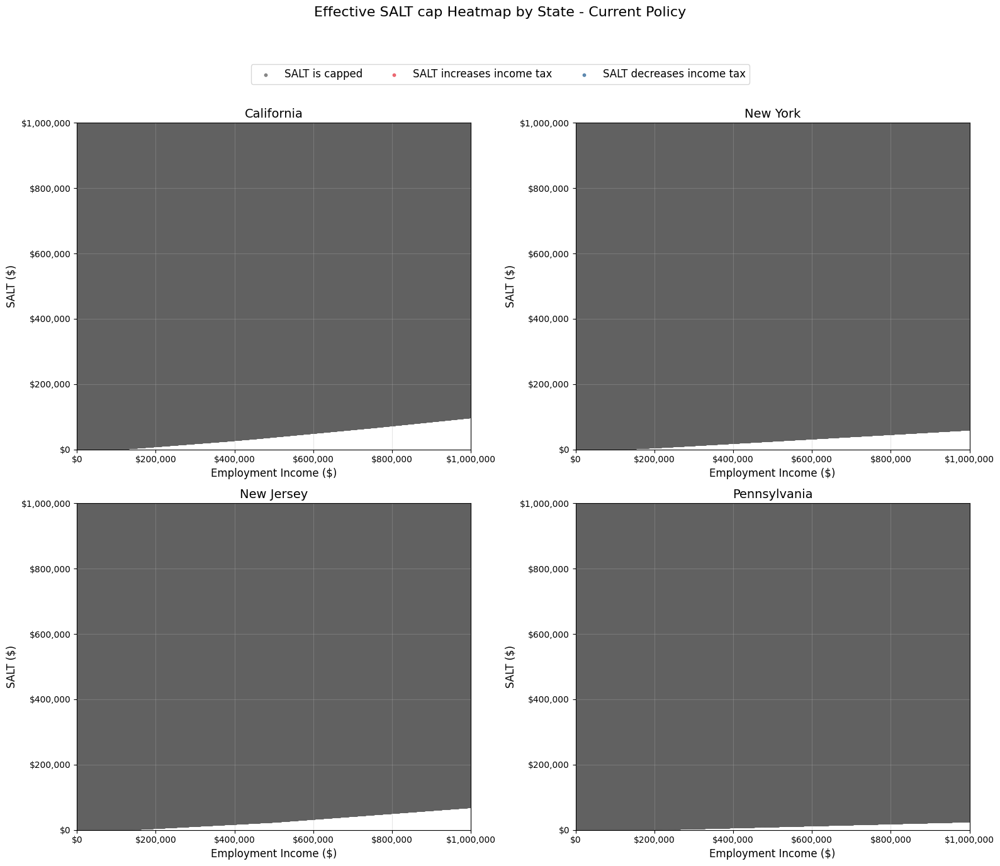

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define colors
BLUE_PRIMARY = "#2C6496"
DARK_GRAY = "#616161"
RED_COLOR = "#E63946"

# Update with your specific states
STATE_NAMES = {
    'CA': 'California',
    'NY': 'New York',
    'NJ': 'New Jersey',
    'PA': 'Pennsylvania'
}

def create_2x2_scatter(df, states=['CA', 'NY', 'NJ', 'PA'], policy='Current Law', y_max=150000, x_max=1000000):
    """
    Create a 2x2 grid of scatter plots showing raw data points with a single legend.
    Three categories:
    - Blue: marginal property tax rate is within 0.1 of 0 (-0.1 < rate <= 0.1)
    - Grey: marginal property tax rate is less than -0.1
    - Red: marginal property tax rate is more than 0.1
    """
    # Create a figure with 2x2 grid of subplots
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    
    # Add a main title for the entire figure
    fig.suptitle(f"Effective SALT cap Heatmap by State - {policy}", fontsize=16, y=0.98)
    
    # Prefilter the dataframe once to only include the relevant policy
    df_filtered = df[df['policy'] == policy]
    
    # For storing legend handles and labels
    legend_handles = []
    legend_labels = []
    
    # Process each state in the appropriate subplot position
    for i, state in enumerate(states[:4]):  # Limit to first 4 states
        # Calculate row and column position
        row = i // 2
        col = i % 2
        
        # Get the appropriate subplot
        ax = axes[row, col]
        
        # Filter data for this state
        mask = df_filtered['state'] == state
        state_data = df_filtered.loc[mask]
        
        # Extract data
        x = state_data['employment_income'].values
        y = state_data['salt_and_property_tax'].values
        rates = state_data['marginal_property_tax_rate'].values
        
        # Define three categories
        is_near_zero = (rates > -0.1) & (rates <= 0.1)  # Blue: within 0.1 of 0
        is_negative = rates <= -0.1  # Grey: less than -0.1
        is_positive = rates > 0.1  # Red: more than 0.1
        
        # Split points by classification
        x_near_zero = x[is_near_zero]
        y_near_zero = y[is_near_zero]
        
        x_negative = x[is_negative]
        y_negative = y[is_negative]
        
        x_positive = x[is_positive]
        y_positive = y[is_positive]
        
        # Print stats for debugging
        print(f"State: {state}")
        print(f"  Total points: {len(state_data)}")
        print(f"  Near zero points (-0.1 < rate <= 0.1): {len(x_near_zero)}")
        print(f"  Negative points (rate <= -0.1): {len(x_negative)}")
        print(f"  Positive points (rate > 0.1): {len(x_positive)}")
        
        # Plot points directly - no binning, no interpolation
        # Store the scatter plot objects to use for the legend
        near_zero_scatter = ax.scatter(x_near_zero, y_near_zero, color=DARK_GRAY, s=10, alpha=0.7)
        negative_scatter = ax.scatter(x_negative, y_negative, color=RED_COLOR, s=10, alpha=0.7)
        positive_scatter = ax.scatter(x_positive, y_positive, color=BLUE_PRIMARY, s=10, alpha=0.7)
        
        # Store handles for legend only from the first subplot
        if i == 0:
            legend_handles = [near_zero_scatter, negative_scatter, positive_scatter]
            legend_labels = ['SALT is capped', 
                             'SALT increases income tax',
                             'SALT decreases income tax']
        
        # Set fixed y-axis range
        ax.set_ylim(0, y_max)
        ax.set_xlim(0, x_max)
        
        # Add labels and title for this subplot
        ax.set_title(f"{STATE_NAMES.get(state, state)}", fontsize=14)
        ax.set_xlabel("Employment Income ($)", fontsize=12)
        ax.set_ylabel("SALT ($)", fontsize=12)
        
        # Format tick labels as dollars
        ax.xaxis.set_major_formatter('${x:,.0f}')
        ax.yaxis.set_major_formatter('${x:,.0f}')
        
        # Add gridlines
        ax.grid(True, alpha=0.3)
    
    # Create a single legend for the entire figure using handles from the first subplot
    fig.legend(legend_handles, legend_labels, 
               loc='upper center', 
               bbox_to_anchor=(0.5, 0.92),
               ncol=3,  # Changed to 3 columns for better spacing
               fontsize=12)
    
    # Adjust layout to make room for the suptitle and legend
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    
    return fig

def create_2x2_charts_for_policies(df, states=['CA', 'NY', 'NJ', 'PA'], policies=['Current Law', 'Current Policy'], y_max=150000, x_max=1000000):
    """
    Create a 2x2 chart for each policy.
    """
    for policy in policies:
        fig = create_2x2_scatter(df, states, policy, y_max=y_max, x_max=x_max)
        plt.show()
        plt.close(fig)

# Example usage:
df = pd.read_csv('effective_cap_data_backup.csv')
create_2x2_charts_for_policies(df, y_max=1000000, x_max=1000000)